In [ ]:
!curl --header "Host: doc-08-7g-docs.googleusercontent.com" --header "User-Agent: Mozilla/5.0 (X11; Linux x86_64) AppleWebKit/537.36 (KHTML, like Gecko) Chrome/83.0.4103.97 Safari/537.36" --header "Accept: text/html,application/xhtml+xml,application/xml;q=0.9,image/webp,image/apng,*/*;q=0.8,application/signed-exchange;v=b3;q=0.9" --header "Accept-Language: en-US,en;q=0.9,pa;q=0.8" --header "Referer: https://drive.google.com/drive/folders/1MIwK7BQMev8f5CbDDVNLPaFGB32pFN60" --header "Cookie: AUTH_pp0n0oquc5c2r320dooslshnqrccu9ln_nonce=lqtu5ofbr584m; _ga=GA1.2.1131566712.1587972007" --header "Connection: keep-alive" "https://doc-08-7g-docs.googleusercontent.com/docs/securesc/kk53kko5gfgvn9rhjbblp8cfatlspjlv/4n4i3ulc2dtu2rqbr6jnbkdv92iarrtk/1594707675000/06629147635963609455/03638208136195004336/1Lz1IHzyhCoWTsDuaD9Kf7OyoLK4XdFTr?e=download&authuser=0&nonce=lqtu5ofbr584m&user=03638208136195004336&hash=pq1grap3lr9bcimhk1mqi3kdm8nrru20" -L -o 'preprocessed_data.csv'

  % Total    % Received % Xferd  Average Speed   Time    Time     Time  Current
                                 Dload  Upload   Total   Spent    Left  Speed
100  118M    0  118M    0     0  69.4M      0 --:--:--  0:00:01 --:--:-- 69.4M


In [ ]:
import pandas as pd
import numpy as np

In [ ]:
data = pd.read_csv('preprocessed_data.csv')

In [ ]:
data.columns

Index(['school_state', 'teacher_prefix', 'project_grade_category',
       'teacher_number_of_previously_posted_projects', 'project_is_approved',
       'clean_categories', 'clean_subcategories', 'essay', 'price'],
      dtype='object')

In [ ]:
from sklearn.model_selection import train_test_split

In [ ]:
preprocessed_data = data[['school_state', 'teacher_prefix', 'project_grade_category',
                          'teacher_number_of_previously_posted_projects','clean_categories', 
                          'clean_subcategories', 'essay', 'price']]

In [ ]:
class_label = data['project_is_approved']

In [ ]:
# Spliting dataset into train and test
X_train, X_test, y_train, y_test = train_test_split(preprocessed_data, class_label, stratify=class_label)

In [ ]:
import tensorflow as tf

In [ ]:
preprocessed_data.columns

Index(['school_state', 'teacher_prefix', 'project_grade_category',
       'teacher_number_of_previously_posted_projects', 'clean_categories',
       'clean_subcategories', 'essay', 'price'],
      dtype='object')

In [ ]:
# Tokenizing essay data
t_essay = tf.keras.preprocessing.text.Tokenizer()
t_essay.fit_on_texts(X_train['essay'])

# Tokenizing school_state
t_state = tf.keras.preprocessing.text.Tokenizer()
t_state.fit_on_texts(X_train['school_state'])

# Tokenizing teacher_prefix
t_prefix = tf.keras.preprocessing.text.Tokenizer()
t_prefix.fit_on_texts(X_train['teacher_prefix'])

# Tokenizing project_grade_category
t_grade = tf.keras.preprocessing.text.Tokenizer()
t_grade.fit_on_texts(X_train['project_grade_category'])

# Tokenizing clean_categories
t_categories = tf.keras.preprocessing.text.Tokenizer()
t_categories.fit_on_texts(X_train['clean_categories'])

# Tokenizing clean_subcategories
t_subcategories = tf.keras.preprocessing.text.Tokenizer()
t_subcategories.fit_on_texts(X_train['clean_subcategories'])

In [ ]:
# Text to sequences for the train data
X_train_essay_sequences = t_essay.texts_to_sequences(X_train['essay'])
X_train_state_sequences = t_state.texts_to_sequences(X_train['school_state']) 

X_train_prefix_sequences = t_prefix.texts_to_sequences(X_train['teacher_prefix'])
X_train_grade_sequences = t_grade.texts_to_sequences(X_train['project_grade_category'])

X_train_categories_sequences = t_categories.texts_to_sequences(X_train['clean_categories'])
X_train_subcategories_sequences = t_subcategories.texts_to_sequences(X_train['clean_subcategories'])

In [ ]:
X_train_state_sequences = np.array(X_train_state_sequences)
X_train_prefix_sequences = np.array(X_train_prefix_sequences)

In [ ]:
# Text to sequences for the train data
X_test_essay_sequences = t_essay.texts_to_sequences(X_test['essay'])
X_test_state_sequences = t_state.texts_to_sequences(X_test['school_state']) 

X_test_prefix_sequences = t_prefix.texts_to_sequences(X_test['teacher_prefix'])
X_test_grade_sequences = t_grade.texts_to_sequences(X_test['project_grade_category'])

X_test_categories_sequences = t_categories.texts_to_sequences(X_test['clean_categories'])
X_test_subcategories_sequences = t_subcategories.texts_to_sequences(X_test['clean_subcategories'])

In [ ]:
X_test_state_sequences = np.array(X_test_state_sequences)
X_test_prefix_sequences = np.array(X_test_prefix_sequences)

In [ ]:
# Getting maximum sequence length for state
temp = []
for ele in X_train_state_sequences:
  temp.append(len(ele))
temp.sort()
max_state_sequence_len=temp[-1]
max_state_sequence_len

1

In [ ]:
# Getting maximum sequence length for prefix
temp = []
for ele in X_train_prefix_sequences:
  temp.append(len(ele))
temp.sort()
max_prefix_sequence_len=temp[-1]
max_prefix_sequence_len

1

In [ ]:
# Getting maximum sequence length grade
temp = []
for ele in X_train_grade_sequences:
  temp.append(len(ele))
temp.sort()
max_grade_sequence_len=temp[-1]
max_grade_sequence_len

3

In [ ]:
# Getting maximum sequence length categories
temp = []
for ele in X_train_categories_sequences:
  temp.append(len(ele))
temp.sort()
max_categories_sequence_len=temp[-1]
max_categories_sequence_len

5

In [ ]:
# Getting maximum sequence length subcategories
temp = []
for ele in X_train_subcategories_sequences:
  temp.append(len(ele))
temp.sort()
max_subcategories_sequence_len=temp[-1]
max_subcategories_sequence_len

5

In [ ]:
# Getting maximum sequence length for essay
temp = []
for ele in X_train_essay_sequences:
  temp.append(len(ele))
temp.sort()
max_essay_sequence_len=temp[-1]
max_essay_sequence_len

339

In [ ]:
# Padding train data
X_train_essay_sequences_padded = tf.keras.preprocessing.sequence.pad_sequences(X_train_essay_sequences, padding='post')
X_train_grade_sequences_padded = tf.keras.preprocessing.sequence.pad_sequences(X_train_grade_sequences, padding='post')
X_train_categories_sequences_padded = tf.keras.preprocessing.sequence.pad_sequences(X_train_categories_sequences, padding='post')
X_train_subcategories_sequences_padded = tf.keras.preprocessing.sequence.pad_sequences(X_train_subcategories_sequences, padding='post')

In [ ]:
X_train_essay_sequences_padded.shape

(81936, 339)

In [ ]:
X_train_grade_sequences_padded.shape

(81936, 3)

In [ ]:
X_train_categories_sequences_padded.shape

(81936, 5)

In [ ]:
X_train_subcategories_sequences_padded.shape

(81936, 5)

In [ ]:
# Padding test data
X_test_essay_sequences_padded = tf.keras.preprocessing.sequence.pad_sequences(X_test_essay_sequences, maxlen=max_essay_sequence_len, padding='post')
X_test_grade_sequences_padded = tf.keras.preprocessing.sequence.pad_sequences(X_test_grade_sequences, maxlen=max_grade_sequence_len, padding='post')
X_test_categories_sequences_padded = tf.keras.preprocessing.sequence.pad_sequences(X_test_categories_sequences, maxlen=max_categories_sequence_len, padding='post')
X_test_subcategories_sequences_padded = tf.keras.preprocessing.sequence.pad_sequences(X_test_subcategories_sequences, maxlen=max_subcategories_sequence_len, padding='post')

In [ ]:
# Getting vocabulary size of the feature essay
essay_vocab_size = len(t_essay.word_index) + 1
print(essay_vocab_size)

50378


In [ ]:
# Getting vocabulary size of the feature school_state
state_vocab_size = len(t_state.word_index) + 1
state_vocab_size

52

In [ ]:
# Getting vocabulary size of the feature teacher_prefix
prefix_vocab_size = len(t_prefix.word_index) + 1
prefix_vocab_size

6

In [ ]:
# Getting vocabulary size of the feature project_grade_category
grade_vocab_size = len(t_grade.word_index) + 1
grade_vocab_size

10

In [ ]:
# Getting vocabulary size of the feature clean_categories
categories_vocab_size = len(t_categories.word_index) + 1
categories_vocab_size

16

In [ ]:
# Getting vocabulary size of the feature clean_subcategories
subcategories_vocab_size = len(t_subcategories.word_index) + 1
subcategories_vocab_size

38

In [ ]:
from google.colab import drive
drive.mount('drive')

Go to this URL in a browser: https://accounts.google.com/o/oauth2/auth?client_id=947318989803-6bn6qk8qdgf4n4g3pfee6491hc0brc4i.apps.googleusercontent.com&redirect_uri=urn%3aietf%3awg%3aoauth%3a2.0%3aoob&response_type=code&scope=email%20https%3a%2f%2fwww.googleapis.com%2fauth%2fdocs.test%20https%3a%2f%2fwww.googleapis.com%2fauth%2fdrive%20https%3a%2f%2fwww.googleapis.com%2fauth%2fdrive.photos.readonly%20https%3a%2f%2fwww.googleapis.com%2fauth%2fpeopleapi.readonly

Enter your authorization code:
··········
Mounted at drive


In [ ]:
# https://machinelearningmastery.com/use-word-embedding-layers-deep-learning-keras/
embeddings_index = dict()
# https://nlp.stanford.edu/projects/glove/
f = open('drive/My Drive/Document_CNN/glove.6B.300d.txt') # Here I am getting the file from my google drive, please download the file from the above link
coefs = []
for line in f:
  values = line.split()
  word = values[0]
  coefs = np.asarray(values[1:], dtype='float32')
  embeddings_index[word] = coefs
f.close()
# create a weight matrix for words in training data
embedding_matrix = np.zeros((essay_vocab_size, 300))
for word, i in t_essay.word_index.items():
	embedding_vector = embeddings_index.get(word)
	if embedding_vector is not None:
		embedding_matrix[i] = embedding_vector

In [ ]:
embedding_matrix.shape

(50378, 300)

In [ ]:
X_train_previous_project = X_train['teacher_number_of_previously_posted_projects'].values
X_test_previous_project = X_test['teacher_number_of_previously_posted_projects'].values
X_train_price = X_train['price'].values
X_test_price = X_test['price'].values

In [ ]:
# Concatenation of numerical data attributes
X_train_remaining = []
X_test_remaining = []
for i in range(len(X_train_previous_project)):
  temp = []
  temp.append(X_train_previous_project[i])
  temp.append(X_train_price[i])
  X_train_remaining.append(temp)

for i in range(len(X_test_previous_project)):
  temp = []
  temp.append(X_test_previous_project[i])
  temp.append(X_test_price[i])
  X_test_remaining.append(temp)
X_train_remaining = np.array(X_train_remaining)
X_test_remaining = np.array(X_test_remaining)

In [ ]:
X_train_remaining.shape

(81936, 2)

In [ ]:
from sklearn.preprocessing import normalize

In [ ]:
# Normalizing data
X_train_remaining_normalized = normalize(X_train_remaining, axis=0)

In [ ]:
# Normalizing data
X_test_remaining_normalized = normalize(X_test_remaining, axis=0)

In [ ]:
import sklearn

In [ ]:
import datetime

In [ ]:
class AUC_Score(tf.keras.callbacks.Callback):
  def __init__(self, x_tr, y_tr, x_te, y_te):
    super().__init__()
    self.x_tr = x_tr
    self.y_tr = y_tr
    self.x_te = x_te
    self.y_te = y_te

  def on_epoch_end(self, epoch, logs={}):
    '''This function calculate AUC value after each epoch'''

    train_predicted_class = (model.predict(self.x_tr) > 0.5).astype("int32")  # Predicting classes for training dataset 
    train_actual_class = self.y_tr    # Getting actual class label for training dataset
    train_predicted_score = model.predict(self.x_tr)  # Predicting the score of the data points in training dataset
    AUC_train = sklearn.metrics.roc_auc_score(train_actual_class, train_predicted_score)  # Calculating AUC value of the model for training dataset
    print('\nAUC value of the model for training dataset =', AUC_train)
    
    test_predicted_class = (model.predict(self.x_te) > 0.5).astype('int32') # Predicting classes for test dataset
    test_actual_class = self.y_te   # Getting actual class label for test dataset
    test_predicted_score = model.predict(self.x_te)     # Predicting the score of the data points in test dataset
    AUC_test_cur = sklearn.metrics.roc_auc_score(test_actual_class, test_predicted_score) # Calculating AUC value of the model for test dataset
    print('\nAUC value of the model for test dataset =', AUC_test_cur)

In [ ]:
%load_ext tensorboard

# Model 1

In [ ]:
# Embedding layer for the 'essay' text
input_lstm_model_1 = tf.keras.Input(shape=(max_essay_sequence_len,), name='input_lstm_model_1')
embd_lstm = tf.keras.layers.Embedding(essay_vocab_size, 300, weights=[embedding_matrix], input_length = max_essay_sequence_len, trainable=False, name='embedding_layer_lstm_model_1')(input_lstm_model_1)
lstm = tf.keras.layers.LSTM(32, return_sequences=True)(embd_lstm)
flatten_lstm_model_1 = tf.keras.layers.Flatten()(lstm)

In [ ]:
# Embedding layer for the 'school_state'
input_state_model_1 = tf.keras.Input(shape=(max_state_sequence_len,), name='input_state_model_1')
embd_state = tf.keras.layers.Embedding(state_vocab_size, 2, input_length=max_state_sequence_len)(input_state_model_1)
flatten_state_model_1 = tf.keras.layers.Flatten()(embd_state)

In [ ]:
# Embedding layer for the 'teacher_prefix'
input_prefix_model_1 = tf.keras.Input(shape=(max_prefix_sequence_len,), name='input_prefix_model_1')
embd_prefix = tf.keras.layers.Embedding(prefix_vocab_size, 2, input_length=max_prefix_sequence_len)(input_prefix_model_1)
flatten_prefix_model_1 = tf.keras.layers.Flatten()(embd_prefix)

In [ ]:
# Embedding layer for the 'grade'
input_grade_model_1 = tf.keras.Input(shape=(max_grade_sequence_len,),name='input_grade_model_1')
embd_grade = tf.keras.layers.Embedding(grade_vocab_size, 2, input_length=max_grade_sequence_len)(input_grade_model_1)
flatten_grade_model_1 = tf.keras.layers.Flatten()(embd_grade)

In [ ]:
# Embedding layer for the 'categories'
input_categories_model_1 = tf.keras.Input(shape=(max_categories_sequence_len,), name='input_categories_model_1')
embd_categories = tf.keras.layers.Embedding(categories_vocab_size, 3, input_length=max_categories_sequence_len)(input_categories_model_1)
flatten_categories_model_1 = tf.keras.layers.Flatten()(embd_categories)

In [ ]:
# Embedding layer for the 'subcategories'
input_subcategories_model_1 = tf.keras.Input(shape=(max_subcategories_sequence_len,), name='input_subcategories_model_1')
embd_subcategories = tf.keras.layers.Embedding(subcategories_vocab_size, 3, input_length=max_subcategories_sequence_len)(input_subcategories_model_1)
flatten_subcategories_model_1 = tf.keras.layers.Flatten()(embd_subcategories)

In [ ]:
# Sub-model for the remaining numeric attributes
input_remaining_model_1 = tf.keras.Input(shape=(2,), name='input_remaining_model_1')
dense_remaining_model_1 = tf.keras.layers.Dense(2, activation='relu', kernel_initializer='he_normal', name='dense_remaining')(input_remaining_model_1)

In [ ]:
# Concatenation of layes
x = tf.keras.layers.concatenate([flatten_lstm_model_1, flatten_state_model_1, flatten_prefix_model_1, flatten_grade_model_1, flatten_categories_model_1, flatten_subcategories_model_1, dense_remaining_model_1])

In [ ]:
dense = tf.keras.layers.Dense(150, activation='relu', kernel_initializer='he_normal', name = 'dense_layer_1_after_concat')(x)
dropout = tf.keras.layers.Dropout(0.03)(dense)
dense = tf.keras.layers.Dense(150, activation='relu', kernel_initializer='he_normal', name = 'dense_layer_2_after_concat')(dropout)
dropout = tf.keras.layers.Dropout(0.03)(dense)
dense = tf.keras.layers.Dense(33, activation='relu', kernel_initializer='he_normal', name = 'dense_layer_3_after_concat')(dropout)
output = tf.keras.layers.Dense(1, activation='sigmoid', kernel_initializer='glorot_normal')(dense)

model = tf.keras.Model(inputs = [input_lstm_model_1, input_state_model_1, input_prefix_model_1, input_grade_model_1, input_categories_model_1, input_subcategories_model_1, input_remaining_model_1], outputs = output)

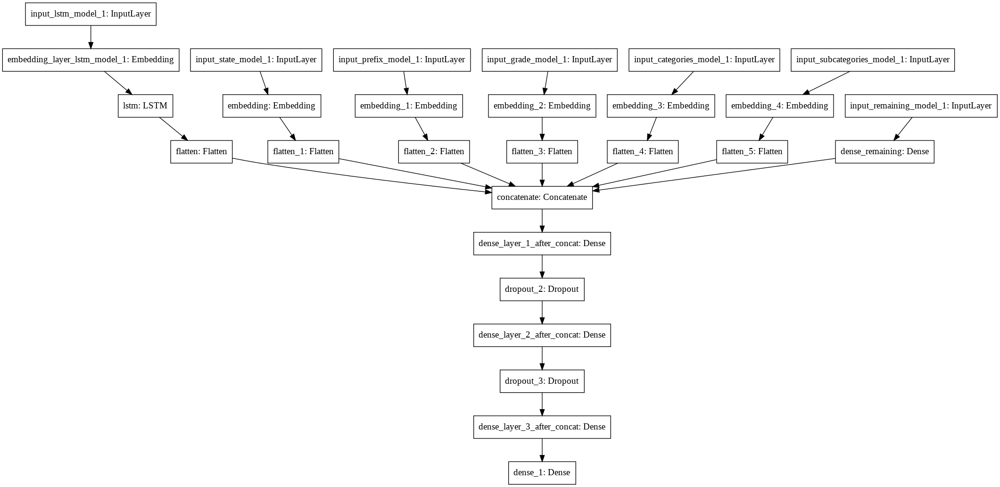

In [ ]:
tf.keras.utils.plot_model(model, "model_1.png")

In [ ]:
# Preparing data sets
X_tr_model_1 = [X_train_essay_sequences_padded, X_train_state_sequences, X_train_prefix_sequences, X_train_grade_sequences_padded,  X_train_categories_sequences_padded,  X_train_subcategories_sequences_padded,  X_train_remaining_normalized]
Y_tr_model_1 = y_train
X_te_model_1 = [X_test_essay_sequences_padded, X_test_state_sequences, X_test_prefix_sequences, X_test_grade_sequences_padded,  X_test_categories_sequences_padded,  X_test_subcategories_sequences_padded,  X_test_remaining_normalized]
Y_te_model_1 = y_test

In [ ]:
log_dir="logs/model_1/" + datetime.datetime.now().strftime("%Y%m%d-%H%M%S")
auc = AUC_Score(X_tr_model_1, Y_tr_model_1, X_te_model_1, Y_te_model_1)
tensorboard = tf.keras.callbacks.TensorBoard(log_dir=log_dir,histogram_freq=1, write_graph=True)

In [ ]:
model.compile(optimizer= tf.keras.optimizers.Adam(0.01), loss = 'binary_crossentropy', metrics=['accuracy'])

In [ ]:
tf.keras.backend.clear_session()

In [ ]:
# Clear any logs from previous runs
!rm -rf ./logs/

In [ ]:
model.fit(X_tr_model_1, Y_tr_model_1, epochs = 2, validation_data = (X_te_model_1, Y_te_model_1), callbacks = [auc, tensorboard])

Epoch 1/2
2560/2561 [============================>.] - ETA: 0s - loss: 0.4004 - accuracy: 0.8482
AUC value of the model for training dataset = 0.7606723770868538

AUC value of the model for test dataset = 0.7237113202879789
2561/2561 [==============================] - 148s 58ms/step - loss: 0.4003 - accuracy: 0.8483 - val_loss: 0.3844 - val_accuracy: 0.8486
Epoch 2/2
2559/2561 [============================>.] - ETA: 0s - loss: 0.3850 - accuracy: 0.8486
AUC value of the model for training dataset = 0.7828012426494847

AUC value of the model for test dataset = 0.7190863224161725
2561/2561 [==============================] - 147s 58ms/step - loss: 0.3849 - accuracy: 0.8486 - val_loss: 0.3897 - val_accuracy: 0.8486


In [ ]:
%tensorboard --logdir logs/model_1

<IPython.core.display.Javascript object>

In [684]:
from google.colab import files
from IPython.display import Image

# Screenshots of scalars of model 1

In [686]:
upload = files.upload()

Saving Screenshot from 2020-07-14 14-30-09.png to Screenshot from 2020-07-14 14-30-09.png


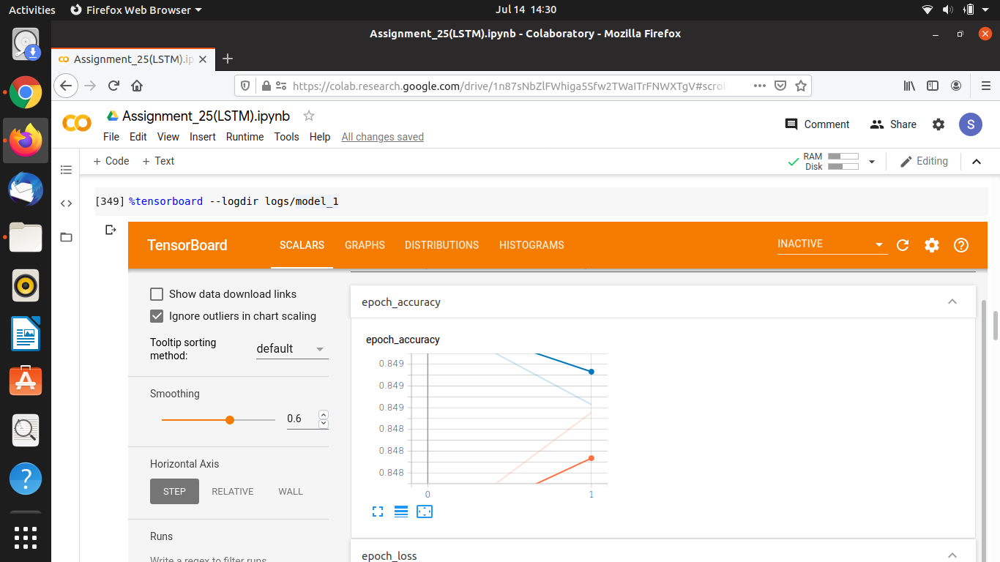

In [689]:
Image('Screenshot from 2020-07-14 14-30-09.png')

In [690]:
upload = files.upload()

Saving Screenshot from 2020-07-14 14-30-18.png to Screenshot from 2020-07-14 14-30-18.png


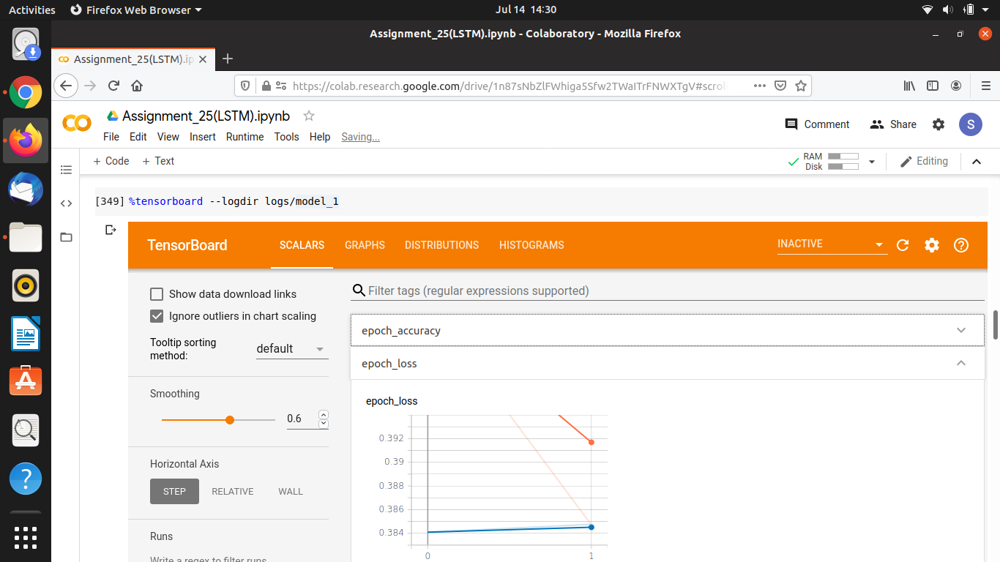

In [691]:
Image('Screenshot from 2020-07-14 14-30-18.png')

# Some screenshots of histograms of model 1

In [692]:
upload = files.upload()

Saving Screenshot from 2020-07-14 14-31-23.png to Screenshot from 2020-07-14 14-31-23.png


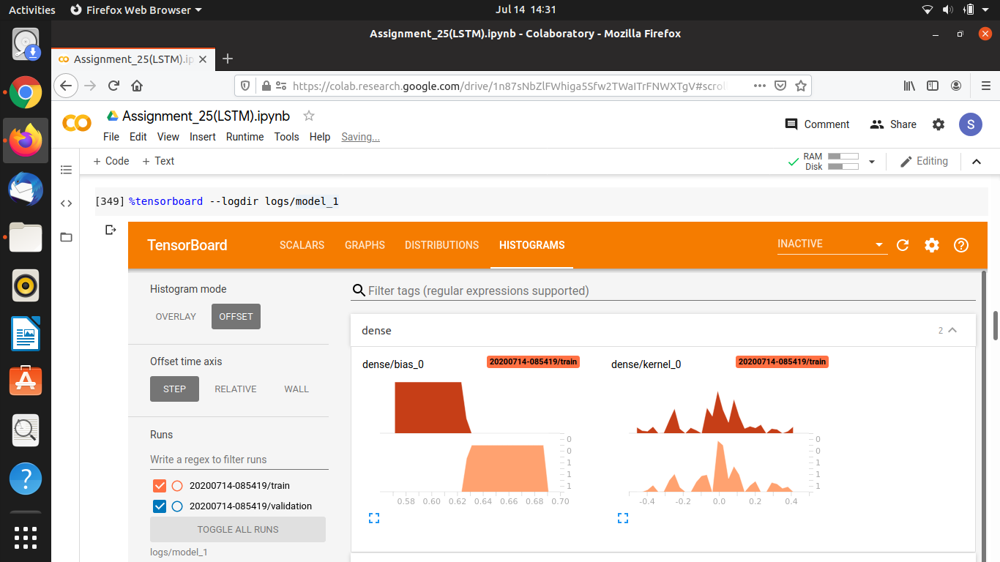

In [693]:
Image('Screenshot from 2020-07-14 14-31-23.png')

In [694]:
upload = files.upload()

Saving Screenshot from 2020-07-14 14-31-25.png to Screenshot from 2020-07-14 14-31-25.png


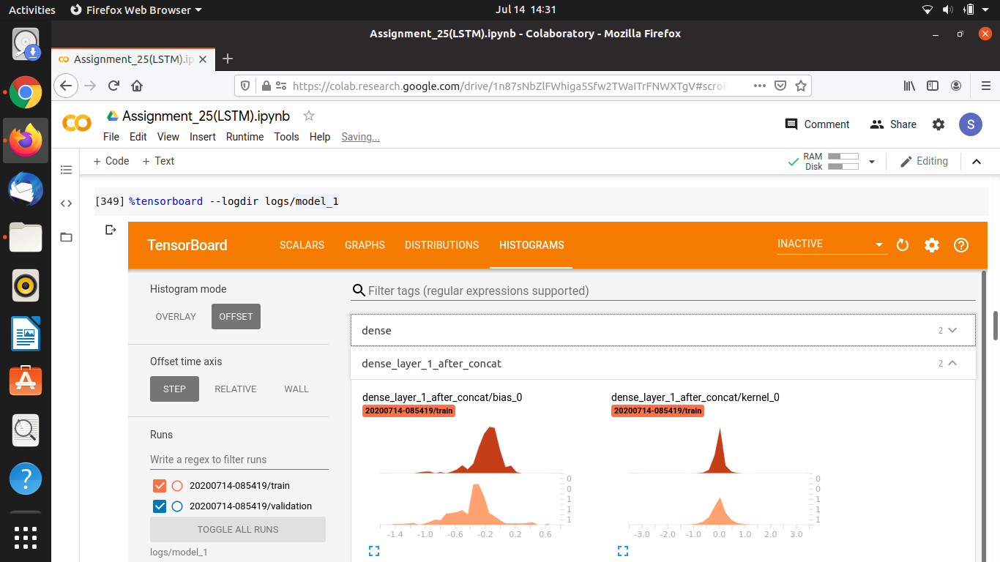

In [695]:
Image('Screenshot from 2020-07-14 14-31-25.png')

In [696]:
upload = files.upload()

Saving Screenshot from 2020-07-14 14-31-47.png to Screenshot from 2020-07-14 14-31-47.png


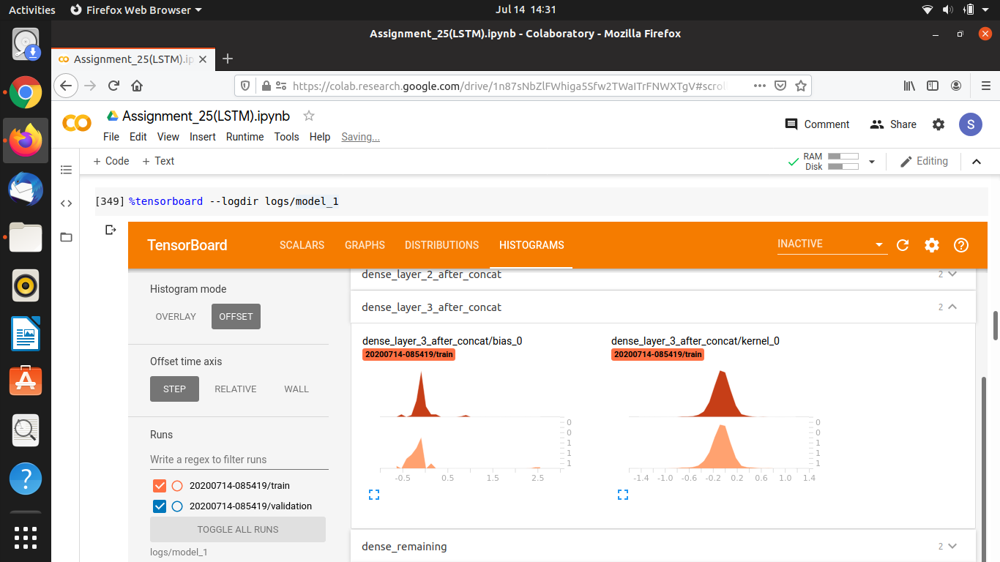

In [697]:
Image('Screenshot from 2020-07-14 14-31-47.png')

# Model 2

In [ ]:
import seaborn as sns

In [ ]:
from sklearn.feature_extraction.text import TfidfVectorizer

In [ ]:
# Initialization for Tfidf vectorizer
vectorizer = TfidfVectorizer(min_df = 2)
vectorizer.fit(np.array(X_train['essay']))
len(vectorizer.idf_)

30743

In [ ]:
vectorizer.idf_

array([ 7.15465064,  5.87915942, 11.21509365, ...,  8.91250856,
       10.70426803, 11.21509365])

In [ ]:
vectorizer.idf_.shape

(30743,)

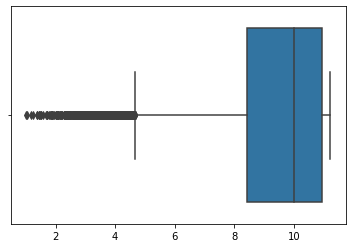

In [ ]:
sns.boxplot(vectorizer.idf_)

In [ ]:
# 95 percentile value of idf values of vocabulary of the essay feature
np.percentile(vectorizer.idf_, 95)

11.215093649607276

In [ ]:
# 2 percentile value of idf values of vocabulary of the essay feature
np.percentile(vectorizer.idf_, 2)

4.379264325568283

In [ ]:
# We are discarding low and hight idf value words
all_words_dict = dict(zip(vectorizer.get_feature_names(), vectorizer.idf_))
chosen_words_dict = {}
for k, v in all_words_dict.items():
  if v > 4 and v < 11:
    chosen_words_dict[k] = v

In [ ]:
len(chosen_words_dict)

24497

In [ ]:
essay_text_preprocessed_tr = X_train['essay']
essay_text_preprocessed_te = X_test['essay'] 

In [ ]:
from tqdm import tqdm

In [ ]:
essay_text_final_tr = []
essay_text_final_te = []

In [ ]:
# Getting train sentences of the essay feature having words with medium idf values
for sent in tqdm(essay_text_preprocessed_tr):
  sent_lis = sent.split()
  new_sent = []
  for word in sent_lis:
    if chosen_words_dict.get(word):
      new_sent.append(word)
  essay_text_final_tr.append(' '.join(new_sent))

100%|██████████| 81936/81936 [00:03<00:00, 21199.08it/s]


In [ ]:
# Getting train sentences of the essay feature having words with medium idf values
for sent in essay_text_preprocessed_te:
  sent_lis = sent.split()
  new_sent = []
  for word in sent_lis:
    if chosen_words_dict.get(word):
      new_sent.append(word)
  essay_text_final_te.append(' '.join(new_sent))

In [ ]:
essay_text_final_tr = np.array(essay_text_final_tr)
essay_text_final_te = np.array(essay_text_final_te)

In [ ]:
print(essay_text_final_tr.shape) 
print(essay_text_final_te.shape)

(81936,)
(27312,)


In [ ]:
# Tokenizing essay data
t_essay_idf = tf.keras.preprocessing.text.Tokenizer()
t_essay_idf.fit_on_texts(essay_text_final_tr)

In [ ]:
# Text to sequences for the train data
X_train_essay_sequences_idf = t_essay_idf.texts_to_sequences(essay_text_final_tr)

In [ ]:
# Text to sequences for the test data
X_test_essay_sequences_idf = t_essay_idf.texts_to_sequences(essay_text_final_te)

In [ ]:
# Getting maximum sequence length for essay
temp = []
for ele in X_train_essay_sequences_idf:
  temp.append(len(ele))
temp.sort()
max_essay_sequence_len_idf=temp[-1]
max_essay_sequence_len_idf

184

In [ ]:
# Padding the train data
X_train_essay_sequences_idf_padded = tf.keras.preprocessing.sequence.pad_sequences(X_train_essay_sequences_idf, padding='post')

In [ ]:
X_train_essay_sequences_idf_padded.shape

(81936, 184)

In [ ]:
# Padding the test data
X_test_essay_sequences_idf_padded = tf.keras.preprocessing.sequence.pad_sequences(X_test_essay_sequences_idf, maxlen=max_essay_sequence_len_idf, padding='post')

In [ ]:
X_test_essay_sequences_idf_padded.shape

(27312, 184)

In [ ]:
essay_vocab_size_idf = len(t_essay_idf.word_index) + 1
print(essay_vocab_size_idf)

24498


In [ ]:
# https://machinelearningmastery.com/use-word-embedding-layers-deep-learning-keras/
embeddings_index_idf = dict()
# https://nlp.stanford.edu/projects/glove/
f = open('drive/My Drive/Document_CNN/glove.6B.300d.txt') # Here I am getting the file from my google drive, please download the file from the above link
coefs = []
for line in f:
  values = line.split()
  word = values[0]
  coefs = np.asarray(values[1:], dtype='float32')
  embeddings_index_idf[word] = coefs
f.close()
# create a weight matrix for words in training data
embedding_matrix_idf = np.zeros((essay_vocab_size_idf, 300))
for word, i in t_essay_idf.word_index.items():
	embedding_vector_idf = embeddings_index_idf.get(word)
	if embedding_vector_idf is not None:
		embedding_matrix_idf[i] = embedding_vector_idf

In [ ]:
# Embedding layer for the 'essay' text
input_lstm_model_2 = tf.keras.Input(shape=(max_essay_sequence_len_idf,), name='input_lstm_model_2')
embd_lstm = tf.keras.layers.Embedding(essay_vocab_size_idf, 300, weights=[embedding_matrix_idf], input_length = max_essay_sequence_len_idf, trainable=False, name='embedding_layer_lstm_model_2')(input_lstm_model_2)
lstm = tf.keras.layers.LSTM(24, return_sequences=True)(embd_lstm)
flatten_lstm_model_2 = tf.keras.layers.Flatten()(lstm)

In [ ]:
# Embedding layer for the 'school_state'
input_state_model_2 = tf.keras.Input(shape=(max_state_sequence_len,), name='input_state_model_2')
embd_state = tf.keras.layers.Embedding(state_vocab_size, 2, input_length=max_state_sequence_len)(input_state_model_2)
flatten_state_model_2 = tf.keras.layers.Flatten()(embd_state)

In [ ]:
# Embedding layer for the 'teacher_prefix'
input_prefix_model_2 = tf.keras.Input(shape=(max_prefix_sequence_len,), name='input_prefix_model_2')
embd_prefix = tf.keras.layers.Embedding(prefix_vocab_size, 2, input_length=max_prefix_sequence_len)(input_prefix_model_2)
flatten_prefix_model_2 = tf.keras.layers.Flatten()(embd_prefix)

In [ ]:
# Embedding layer for the 'grade'
input_grade_model_2 = tf.keras.Input(shape=(max_grade_sequence_len,),name='input_grade_model_2')
embd_grade = tf.keras.layers.Embedding(grade_vocab_size, 2, input_length=max_grade_sequence_len)(input_grade_model_2)
flatten_grade_model_2 = tf.keras.layers.Flatten()(embd_grade)

In [ ]:
# Embedding layer for the 'categories'
input_categories_model_2 = tf.keras.Input(shape=(max_categories_sequence_len,), name='input_categories_model_2')
embd_categories = tf.keras.layers.Embedding(categories_vocab_size, 3, input_length=max_categories_sequence_len)(input_categories_model_2)
flatten_categories_model_2 = tf.keras.layers.Flatten()(embd_categories)

In [ ]:
# Embedding layer for the 'subcategories'
input_subcategories_model_2 = tf.keras.Input(shape=(max_subcategories_sequence_len,), name='input_subcategories_model_2')
embd_subcategories = tf.keras.layers.Embedding(subcategories_vocab_size, 3, input_length=max_subcategories_sequence_len)(input_subcategories_model_2)
flatten_subcategories_model_2 = tf.keras.layers.Flatten()(embd_subcategories)

In [ ]:
# Sub-model for the remaining numeric attributes
input_remaining_model_2 = tf.keras.Input(shape=(2,), name='input_remaining_model_2')
dense_remaining_model_2 = tf.keras.layers.Dense(2, activation='relu', kernel_initializer='he_normal', name='dense_remaining')(input_remaining_model_2)

In [ ]:
# Concatenation of layers
x = tf.keras.layers.concatenate([flatten_lstm_model_2, flatten_state_model_2, flatten_prefix_model_2, flatten_grade_model_2, flatten_categories_model_2, flatten_subcategories_model_2, dense_remaining_model_2])

In [ ]:
tf.keras.backend.clear_session()

In [ ]:
# Clear any logs from previous runs
!rm -rf ./logs/

In [ ]:
dense = tf.keras.layers.Dense(100, activation='relu', kernel_initializer='he_normal', name = 'dense_layer_1_after_concat_model_2')(x)
dropout = tf.keras.layers.Dropout(0.03)(dense)
dense = tf.keras.layers.Dense(100, activation='relu', kernel_initializer='he_normal', name = 'dense_layer_2_after_concat_model_2')(dropout)
dropout = tf.keras.layers.Dropout(0.03)(dense)
dense = tf.keras.layers.Dense(25, activation='relu', kernel_initializer='he_normal', name = 'dense_layer_5_after_concat_model_2')(dropout)
output = tf.keras.layers.Dense(1, activation='sigmoid', kernel_initializer='glorot_normal')(dense)

model = tf.keras.Model(inputs = [input_lstm_model_2, input_state_model_2, input_prefix_model_2, input_grade_model_2, input_categories_model_2, input_subcategories_model_2, input_remaining_model_2], outputs = output)

In [ ]:
# Preparing data sets
X_tr_model_2 = [X_train_essay_sequences_idf_padded, X_train_state_sequences, X_train_prefix_sequences, X_train_grade_sequences_padded,  X_train_categories_sequences_padded,  X_train_subcategories_sequences_padded,  X_train_remaining_normalized]
Y_tr_model_2 = y_train
X_te_model_2 = [X_test_essay_sequences_idf_padded, X_test_state_sequences, X_test_prefix_sequences, X_test_grade_sequences_padded,  X_test_categories_sequences_padded,  X_test_subcategories_sequences_padded,  X_test_remaining_normalized]
Y_te_model_2 = y_test

In [ ]:
log_dir="logs/model_2/" + datetime.datetime.now().strftime("%Y%m%d-%H%M%S")
auc = AUC_Score(X_tr_model_2, Y_tr_model_2, X_te_model_2, Y_te_model_2)
tensorboard = tf.keras.callbacks.TensorBoard(log_dir=log_dir,histogram_freq=1, write_graph=True)

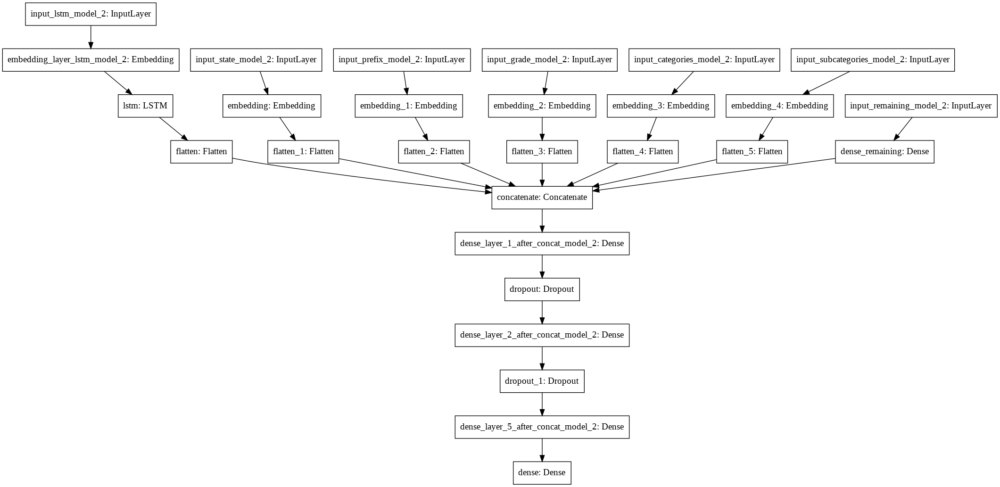

In [ ]:
tf.keras.utils.plot_model(model, "model_2.png")

In [ ]:
model.compile(optimizer= tf.keras.optimizers.Adam(0.01), loss = 'binary_crossentropy', metrics=['accuracy'])

In [ ]:
model.fit(X_tr_model_2, Y_tr_model_2, epochs = 2, validation_data = (X_te_model_2, Y_te_model_2), callbacks = [auc, tensorboard])

Epoch 1/2
2558/2561 [============================>.] - ETA: 0s - loss: 0.4063 - accuracy: 0.8476
AUC value of the model for training dataset = 0.7328447506146553

AUC value of the model for test dataset = 0.703084845992219
2561/2561 [==============================] - 98s 38ms/step - loss: 0.4064 - accuracy: 0.8476 - val_loss: 0.3922 - val_accuracy: 0.8472
Epoch 2/2
2560/2561 [============================>.] - ETA: 0s - loss: 0.3924 - accuracy: 0.8478
AUC value of the model for training dataset = 0.7532560082657193

AUC value of the model for test dataset = 0.7043930487518268
2561/2561 [==============================] - 97s 38ms/step - loss: 0.3924 - accuracy: 0.8478 - val_loss: 0.3912 - val_accuracy: 0.8485


In [ ]:
%tensorboard --logdir logs/model_2

<IPython.core.display.Javascript object>

# Screenshots of scalars of model 2

In [698]:
upload = files.upload()

Saving Screenshot from 2020-07-14 16-51-43.png to Screenshot from 2020-07-14 16-51-43.png


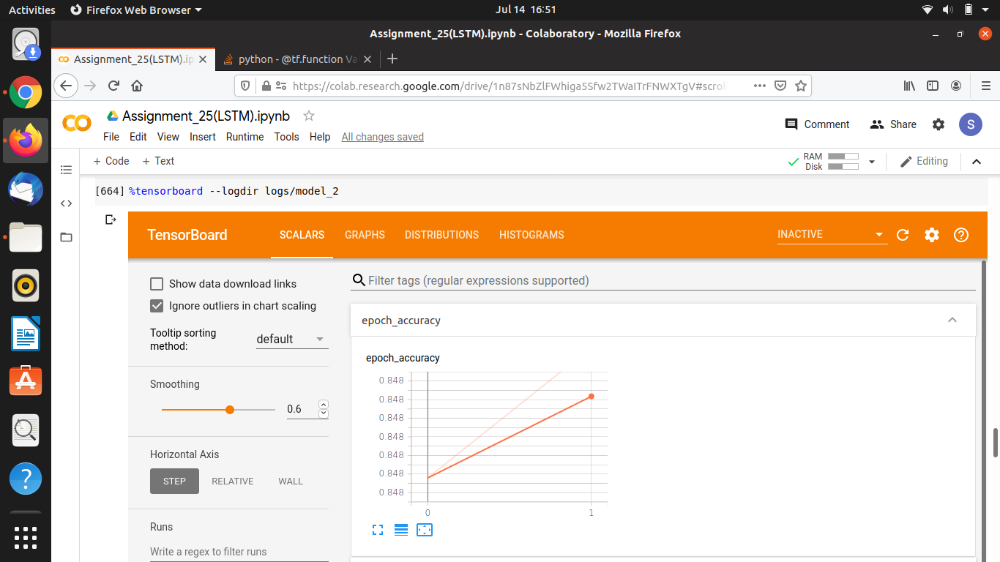

In [699]:
Image('Screenshot from 2020-07-14 16-51-43.png')

In [700]:
upload = files.upload()

Saving Screenshot from 2020-07-14 16-51-52.png to Screenshot from 2020-07-14 16-51-52.png


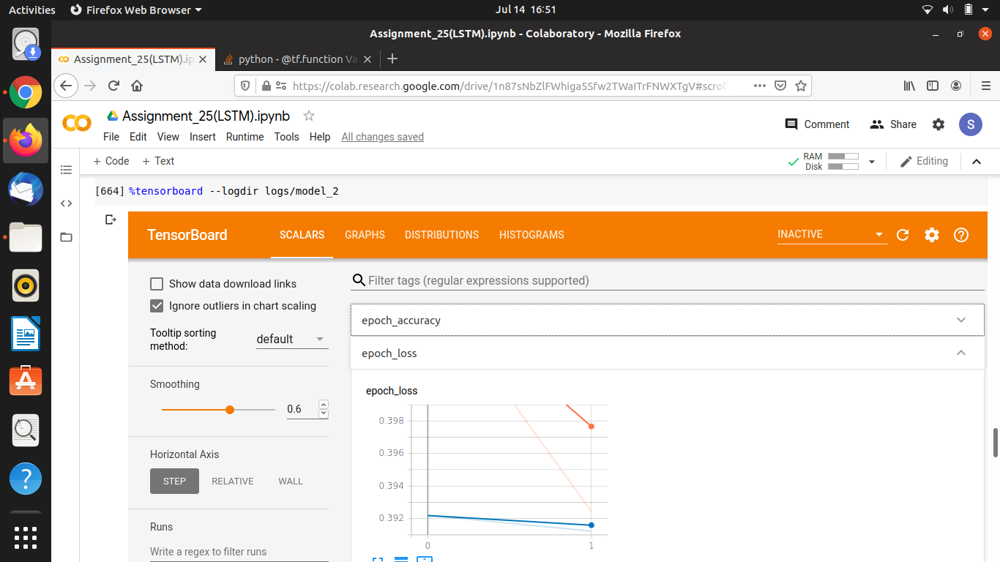

In [701]:
Image('Screenshot from 2020-07-14 16-51-52.png')

# Some screenshots of histograms of model 2

In [702]:
upload = files.upload()

Saving Screenshot from 2020-07-14 16-52-29.png to Screenshot from 2020-07-14 16-52-29.png


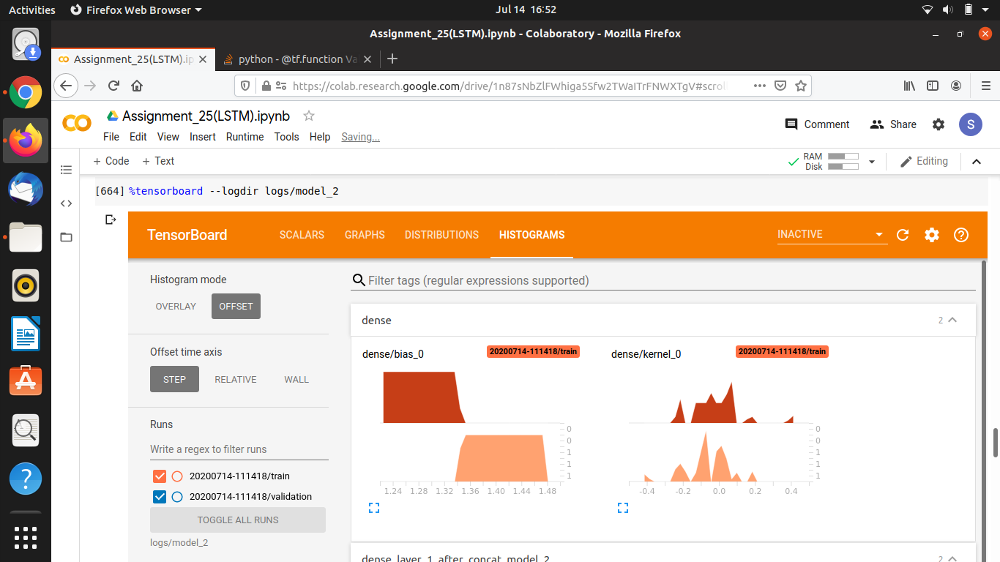

In [703]:
Image('Screenshot from 2020-07-14 16-52-29.png')

In [704]:
upload = files.upload()

Saving Screenshot from 2020-07-14 16-52-42.png to Screenshot from 2020-07-14 16-52-42.png


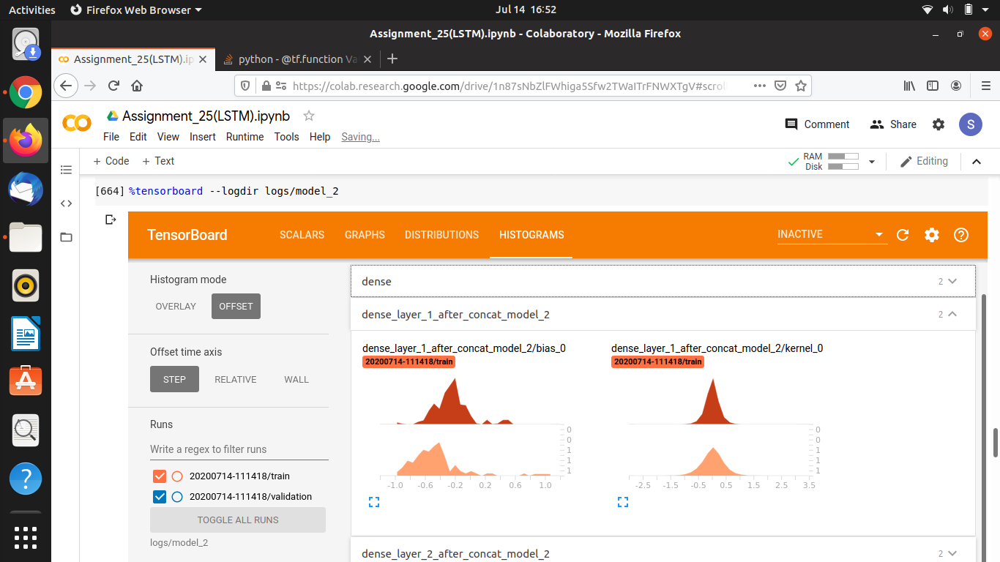

In [705]:
Image('Screenshot from 2020-07-14 16-52-42.png')

In [706]:
upload = files.upload()

Saving Screenshot from 2020-07-14 16-52-50.png to Screenshot from 2020-07-14 16-52-50.png


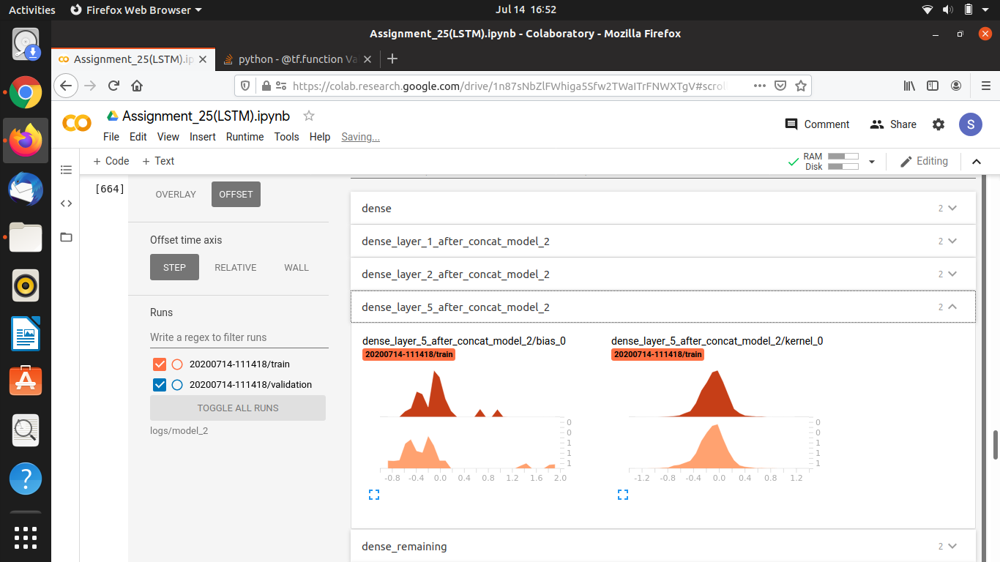

In [707]:
Image('Screenshot from 2020-07-14 16-52-50.png')

# Model 3

In [ ]:
from sklearn.preprocessing import OneHotEncoder

In [ ]:
state_one_hot = OneHotEncoder()
X_train_state = np.array(X_train['school_state'])
X_train_state = X_train_state.reshape(-1, 1)
state_one_hot.fit(X_train_state)

OneHotEncoder(categories='auto', drop=None, dtype=<class 'numpy.float64'>,
              handle_unknown='error', sparse=True)

In [ ]:
# One not encoding of the feature school_state for train data
X_train_state_one_hot = state_one_hot.transform(X_train_state)
X_train_state_one_hot.shape

(81936, 51)

In [ ]:
# One not encoding of the feature school_state for test data
X_test_state = np.array(X_test['school_state'])
X_test_state = X_test_state.reshape(-1, 1)
X_test_state_one_hot = state_one_hot.transform(X_test_state)
X_test_state_one_hot.shape

(27312, 51)

In [ ]:
prefix_one_hot = OneHotEncoder()
X_train_prefix = np.array(X_train['teacher_prefix'])
X_train_prefix = X_train_prefix.reshape(-1, 1)
prefix_one_hot.fit(X_train_prefix)

OneHotEncoder(categories='auto', drop=None, dtype=<class 'numpy.float64'>,
              handle_unknown='error', sparse=True)

In [ ]:
# One not encoding of the feature teacher_prefix for train data
X_train_prefix_one_hot = prefix_one_hot.transform(X_train_prefix)
X_train_prefix_one_hot.shape

(81936, 5)

In [ ]:
# One not encoding of the feature teacher_prefix for test data
X_test_prefix = np.array(X_test['teacher_prefix'])
X_test_prefix = X_test_prefix.reshape(-1, 1)
X_test_prefix_one_hot = prefix_one_hot.transform(X_test_prefix)
X_test_prefix_one_hot.shape

(27312, 5)

In [ ]:
grade_one_hot = OneHotEncoder()
X_train_grade = X_train['project_grade_category']
X_train_grade = np.array(X_train_grade).reshape(-1, 1)
grade_one_hot.fit(X_train_grade)

OneHotEncoder(categories='auto', drop=None, dtype=<class 'numpy.float64'>,
              handle_unknown='error', sparse=True)

In [ ]:
# One not encoding of the feature project_grade_category for train data
X_train_grade_one_hot = grade_one_hot.transform(X_train_grade)
X_train_grade_one_hot.shape

(81936, 4)

In [ ]:
# One not encoding of the feature project_grade_category for test data
X_test_grade = X_test['project_grade_category']
X_test_grade = np.array(X_test_grade).reshape(-1, 1)
X_test_grade_one_hot = grade_one_hot.transform(X_test_grade)
X_test_grade_one_hot.shape

(27312, 4)

In [ ]:
categories_one_hot = OneHotEncoder()
X_train_categories = X_train['clean_categories']
X_train_categories = np.array(X_train_categories).reshape(-1, 1)
categories_one_hot.fit(X_train_categories)

OneHotEncoder(categories='auto', drop=None, dtype=<class 'numpy.float64'>,
              handle_unknown='error', sparse=True)

In [ ]:
# One not encoding of the feature clean_categories for train data
X_train_categories_one_hot = categories_one_hot.transform(X_train_categories)
X_train_categories_one_hot.shape

(81936, 51)

In [ ]:
# One not encoding of the feature clean_categories for test data
X_test_categories = X_test['clean_categories']
X_test_categories = np.array(X_test_categories).reshape(-1, 1)
X_test_categories_one_hot = categories_one_hot.transform(X_test_categories)
X_test_categories_one_hot.shape

(27312, 51)

In [ ]:
subcategories_one_hot = OneHotEncoder()
subcategories = data['clean_subcategories']
subcategories = np.array(subcategories).reshape(-1, 1)
subcategories_one_hot.fit(subcategories)

OneHotEncoder(categories='auto', drop=None, dtype=<class 'numpy.float64'>,
              handle_unknown='error', sparse=True)

In [ ]:
# One not encoding of the feature clean_subcategories for test data
X_train_subcategories = X_train['clean_subcategories']
X_train_subcategories = np.array(X_train_subcategories).reshape(-1, 1)
X_train_subcategories_one_hot = subcategories_one_hot.transform(X_train_subcategories)
X_train_subcategories_one_hot.shape

(81936, 401)

In [ ]:
# One not encoding of the feature clean_subcategories for test data
X_test_subcategories = X_test['clean_subcategories']
X_test_subcategories = np.array(X_test_subcategories).reshape(-1, 1)
X_test_subcategories_one_hot = subcategories_one_hot.transform(X_test_subcategories)
X_test_subcategories_one_hot.shape

(27312, 401)

In [ ]:
from scipy.sparse import hstack

In [ ]:
# Concatenation of all the feature except the feature essay
X_train_other = hstack((X_train_state_one_hot, X_train_prefix_one_hot, X_train_grade_one_hot, X_train_categories_one_hot, X_train_subcategories_one_hot, X_train_remaining_normalized)).tocsr()
X_test_other = hstack((X_test_state_one_hot, X_test_prefix_one_hot, X_test_grade_one_hot, X_test_categories_one_hot, X_test_subcategories_one_hot, X_test_remaining_normalized)).tocsr()

In [ ]:
X_train_other = np.array(X_train_other.todense())
X_train_other = X_train_other.reshape(X_train_other.shape[0], X_train_other.shape[1], 1)
X_test_other = np.array(X_test_other.todense())
X_test_other = X_test_other.reshape(X_test_other.shape[0], X_test_other.shape[1], 1)

In [ ]:
print('X_train_other shape', X_train_other.shape)
print('X_test_other shape', X_test_other.shape)

X_train_other shape (81936, 514, 1)
X_test_other shape (27312, 514, 1)


In [ ]:
tf.keras.backend.clear_session()

In [ ]:
# Clear any logs from previous runs
!rm -rf ./logs/

In [ ]:
# Embedding layer for the 'essay' text
input_lstm_model_3 = tf.keras.Input(shape=(max_essay_sequence_len,), name='input_lstm_model_3')
embd_lstm = tf.keras.layers.Embedding(essay_vocab_size, 300, weights=[embedding_matrix], input_length = max_essay_sequence_len, trainable=False, name='embedding_layer_lstm_model_3')(input_lstm_model_3)
lstm = tf.keras.layers.LSTM(32, return_sequences=True)(embd_lstm)
flatten_lstm_model_3 = tf.keras.layers.Flatten()(lstm)

In [ ]:
input_otherthan_model_3 = tf.keras.Input(shape=(X_train_other.shape[1], 1), name='input_other_model_3')
conv_layer = tf.keras.layers.Conv1D(16, 4, activation='relu', kernel_initializer='he_normal', name='model_3_conv_layer_1')(input_otherthan_model_3)
max_pool_layer = tf.keras.layers.MaxPool1D(pool_size=2, name='model_3_max_pool_layer_1')(conv_layer)
conv_layer = tf.keras.layers.Conv1D(16, 4, activation='relu', kernel_initializer='he_normal', name='model_3_conv_layer_2')(max_pool_layer)
max_pool_layer = tf.keras.layers.MaxPool1D(pool_size=2, name='model_3_max_pool_layer_2')(conv_layer)
conv_layer = tf.keras.layers.Conv1D(16, 4, activation='relu', kernel_initializer='he_normal', name='model_3_conv_layer_3')(max_pool_layer)

flatten_conv1D_model_3 = tf.keras.layers.Flatten()(conv_layer)

In [ ]:
# Concatenation of layers
x = tf.keras.layers.concatenate([flatten_lstm_model_3, flatten_conv1D_model_3])

In [ ]:
dense = tf.keras.layers.Dense(100, activation='relu', kernel_initializer='he_normal', name = 'dense_layer_1_after_concat_model_3')(x)
dropout = tf.keras.layers.Dropout(0.03)(dense)
dense = tf.keras.layers.Dense(100, activation='relu', kernel_initializer='he_normal', name = 'dense_layer_2_after_concat_model_3')(dropout)
dropout = tf.keras.layers.Dropout(0.03)(dense)
dense = tf.keras.layers.Dense(33, activation='relu', kernel_initializer='he_normal', name = 'dense_layer_5_after_concat_model_3')(dropout)
output = tf.keras.layers.Dense(1, activation='sigmoid', kernel_initializer='glorot_normal')(dense)

model = tf.keras.Model(inputs = [input_lstm_model_3, input_otherthan_model_3], outputs = output)

In [ ]:
# Preparing data sets
X_tr_model_3 = [X_train_essay_sequences_padded, X_train_other]
Y_tr_model_3 = y_train
X_te_model_3 = [X_test_essay_sequences_padded, X_test_other]
Y_te_model_3 = y_test

In [ ]:
log_dir="logs/model_3/" + datetime.datetime.now().strftime("%Y%m%d-%H%M%S")
auc = AUC_Score(X_tr_model_3, Y_tr_model_3, X_te_model_3, Y_te_model_3)
tensorboard = tf.keras.callbacks.TensorBoard(log_dir=log_dir,histogram_freq=1, write_graph=True)

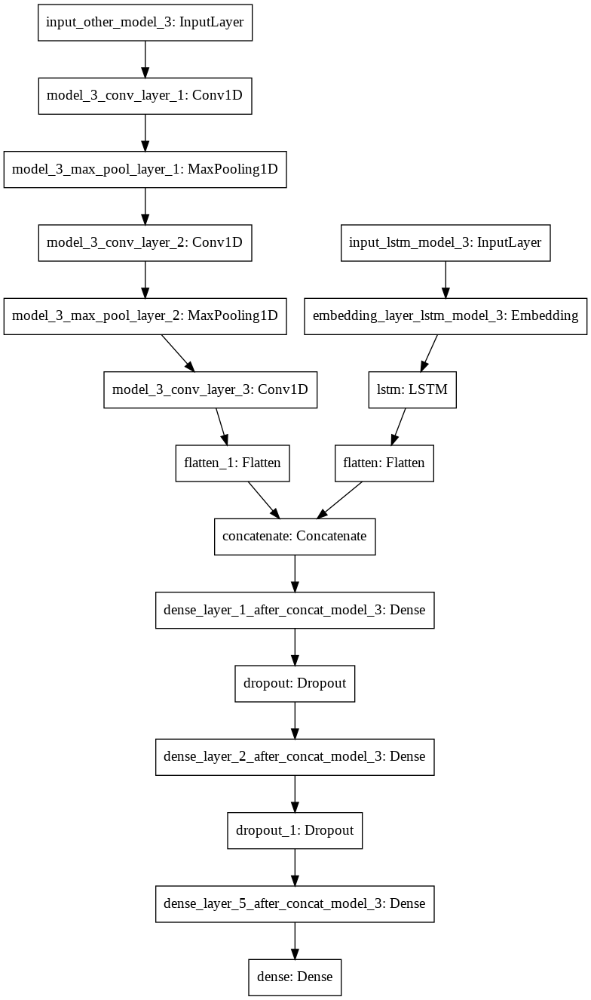

In [ ]:
tf.keras.utils.plot_model(model, "model_3.png")

In [ ]:
model.compile(optimizer= tf.keras.optimizers.Adam(0.01), loss = 'binary_crossentropy', metrics=['accuracy'])

In [ ]:
model.fit(X_tr_model_3, Y_tr_model_3, epochs = 3, batch_size = 300, validation_data = (X_te_model_3, Y_te_model_3), callbacks = [auc, tensorboard])

Epoch 1/3
274/274 [==============================] - ETA: 0s - loss: 0.4246 - accuracy: 0.8420
AUC value of the model for training dataset = 0.7505419259954085

AUC value of the model for test dataset = 0.732307261597237
274/274 [==============================] - 99s 361ms/step - loss: 0.4246 - accuracy: 0.8420 - val_loss: 0.3791 - val_accuracy: 0.8515
Epoch 2/3
273/274 [============================>.] - ETA: 0s - loss: 0.3718 - accuracy: 0.8539
AUC value of the model for training dataset = 0.7943573550273375

AUC value of the model for test dataset = 0.7390221665562787
274/274 [==============================] - 95s 345ms/step - loss: 0.3719 - accuracy: 0.8538 - val_loss: 0.3750 - val_accuracy: 0.8513
Epoch 3/3
273/274 [============================>.] - ETA: 0s - loss: 0.3547 - accuracy: 0.8599
AUC value of the model for training dataset = 0.8593834970199834

AUC value of the model for test dataset = 0.726485978917362
274/274 [==============================] - 92s 337ms/step - loss: 0.

In [718]:
%tensorboard --logdir logs/model_3

Reusing TensorBoard on port 6008 (pid 5105), started 3:26:48 ago. (Use '!kill 5105' to kill it.)

<IPython.core.display.Javascript object>

# Screenshots of scalars of model 3

In [708]:
upload = files.upload()

Saving Screenshot from 2020-07-14 17-02-14.png to Screenshot from 2020-07-14 17-02-14.png


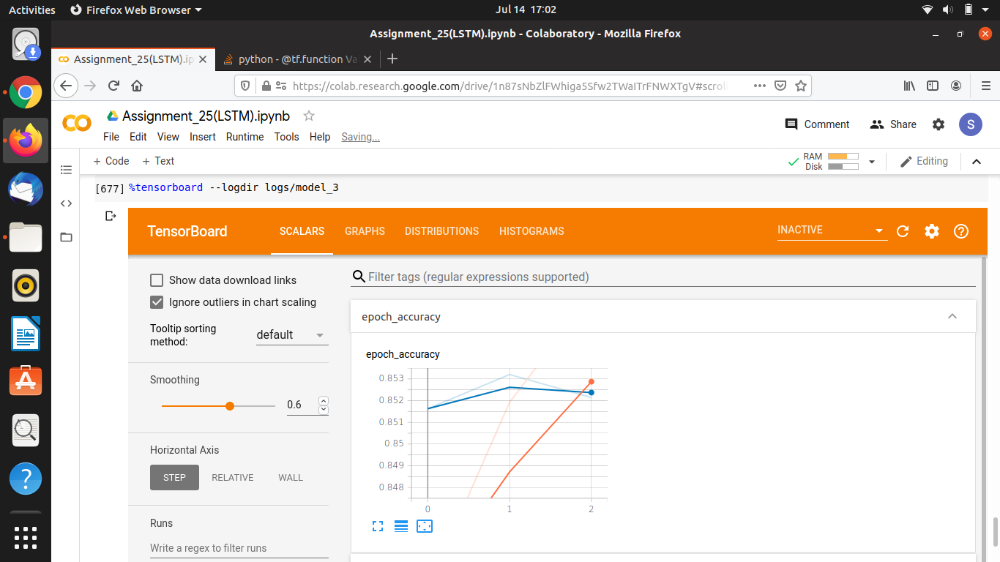

In [709]:
Image('Screenshot from 2020-07-14 17-02-14.png')

In [710]:
upload = files.upload()

Saving Screenshot from 2020-07-14 17-02-19.png to Screenshot from 2020-07-14 17-02-19.png


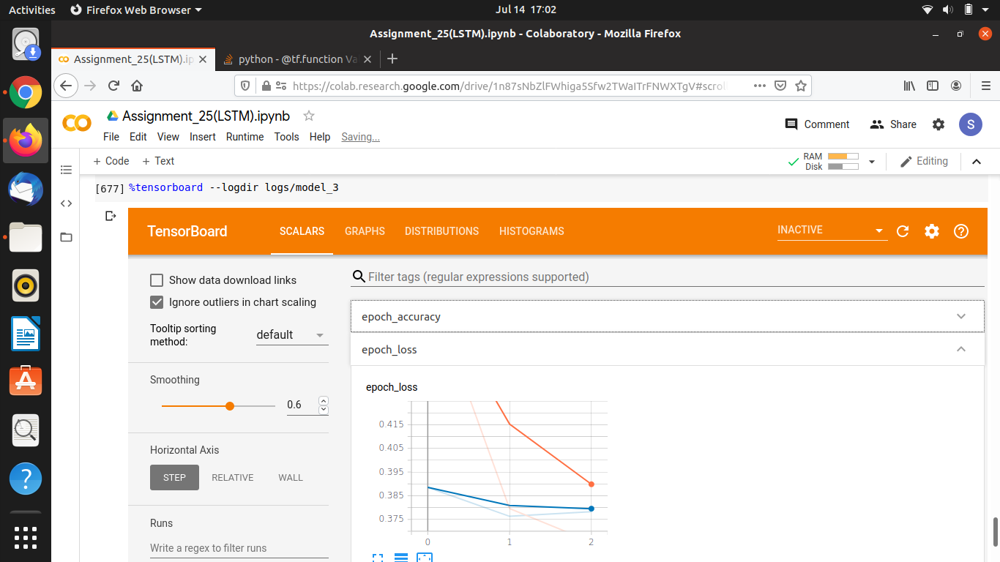

In [711]:
Image('Screenshot from 2020-07-14 17-02-19.png')

# Some screenshots of histograms of model 3

In [712]:
upload = files.upload()

Saving Screenshot from 2020-07-14 17-02-49.png to Screenshot from 2020-07-14 17-02-49.png


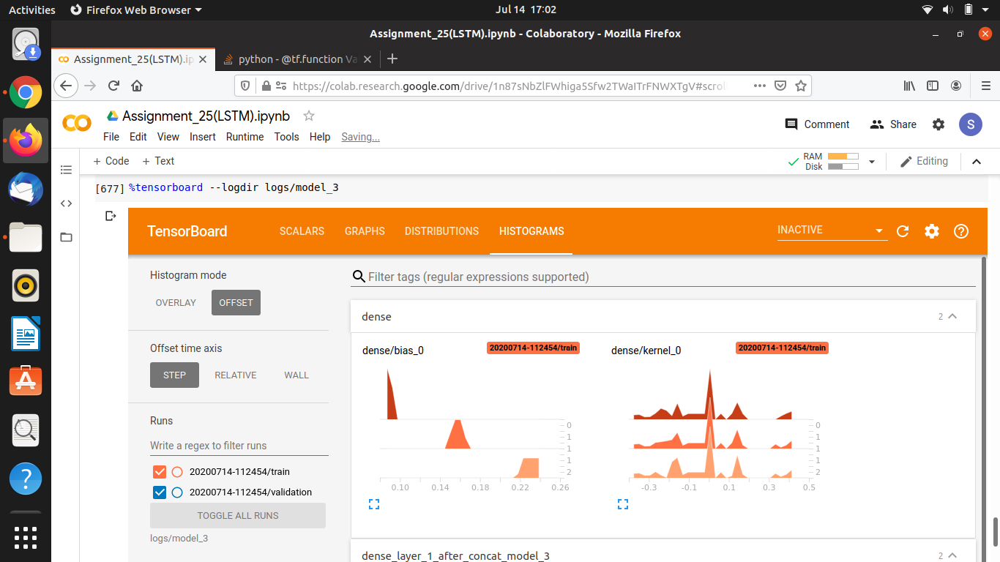

In [713]:
Image('Screenshot from 2020-07-14 17-02-49.png')

In [714]:
upload = files.upload()

Saving Screenshot from 2020-07-14 17-02-54.png to Screenshot from 2020-07-14 17-02-54.png


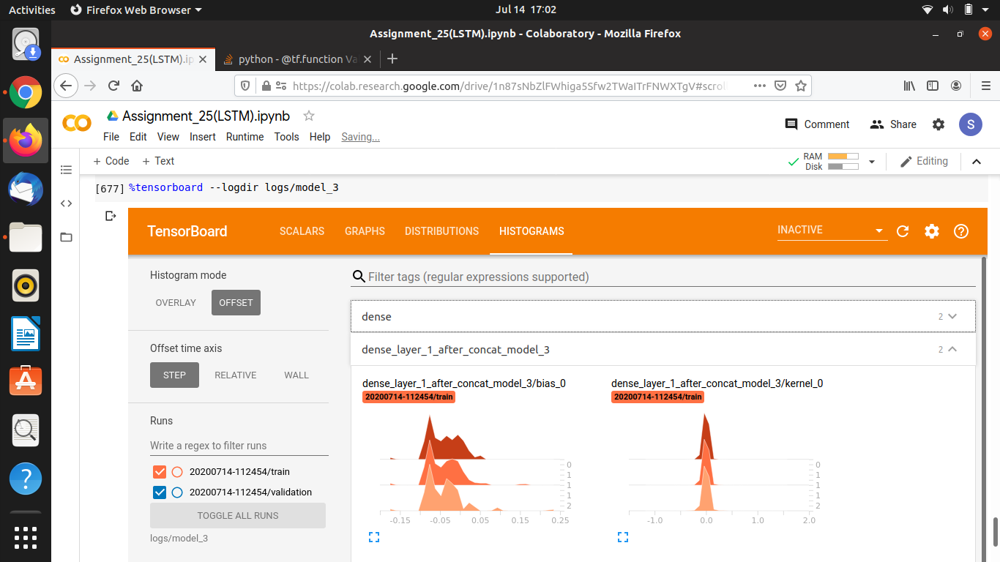

In [715]:
Image('Screenshot from 2020-07-14 17-02-54.png')

In [716]:
upload = files.upload()

Saving Screenshot from 2020-07-14 17-03-03.png to Screenshot from 2020-07-14 17-03-03.png


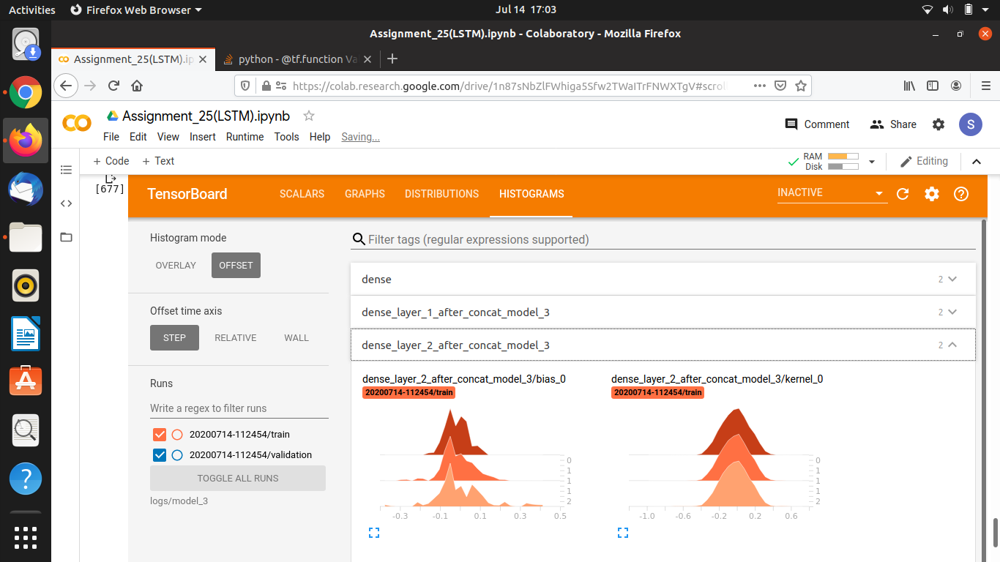

In [717]:
Image('Screenshot from 2020-07-14 17-03-03.png')